<h1>Social and Economic Network Analysis</h1>
<h3>Visualising Stack Overflow questions and tags as a network</h3>
<b>Team Members</b><br>
<i>Priyadarsan M (18z239)</i><br>
<i>Rajasuriya C K (18z240)</i><br>
<i>Arul Jyothi S (18z206)</i><br>
<i>Akilan R (18z204)</i><br>
<i>Mohanaprasanth T (19z431)</i><br>

<h2>1. Graph Plotting and Analyzing Basic measures <h2>

In [1]:
#Import required packages
import pandas as pd
import networkx as nx
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Read the tags dataset and considering the first 1500 nodes
df1 = pd.read_csv('question_tags.csv')
df1 = df1.iloc[:1500]

In [3]:
#Initializing a graph variable
G = nx.Graph()

In [4]:
#Constructing the graph
G = nx.from_pandas_edgelist(df1, 'Id', 'Tag')

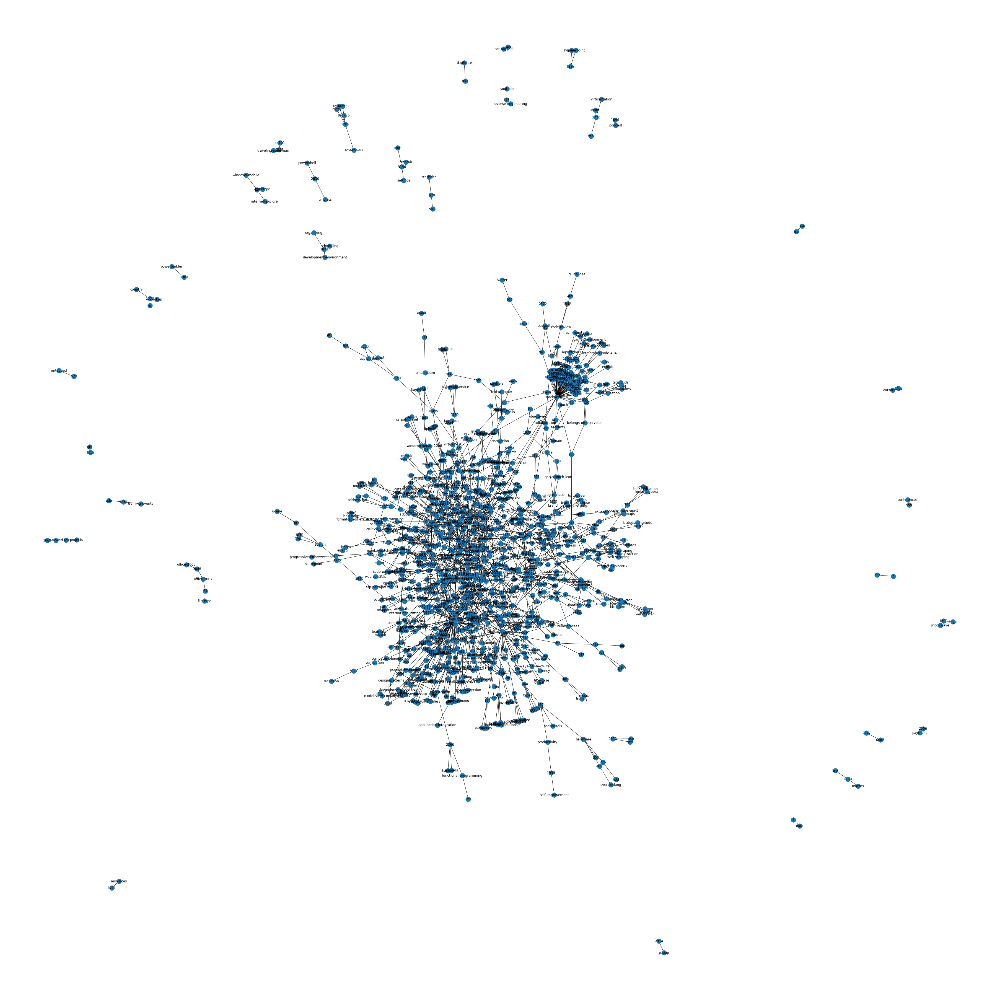

In [5]:
#Plotting the graph
figure(figsize=(50, 50))
Gr = nx.draw(G, with_labels=True)
Gr

<h3>1.1. Degree Centrality</h3>

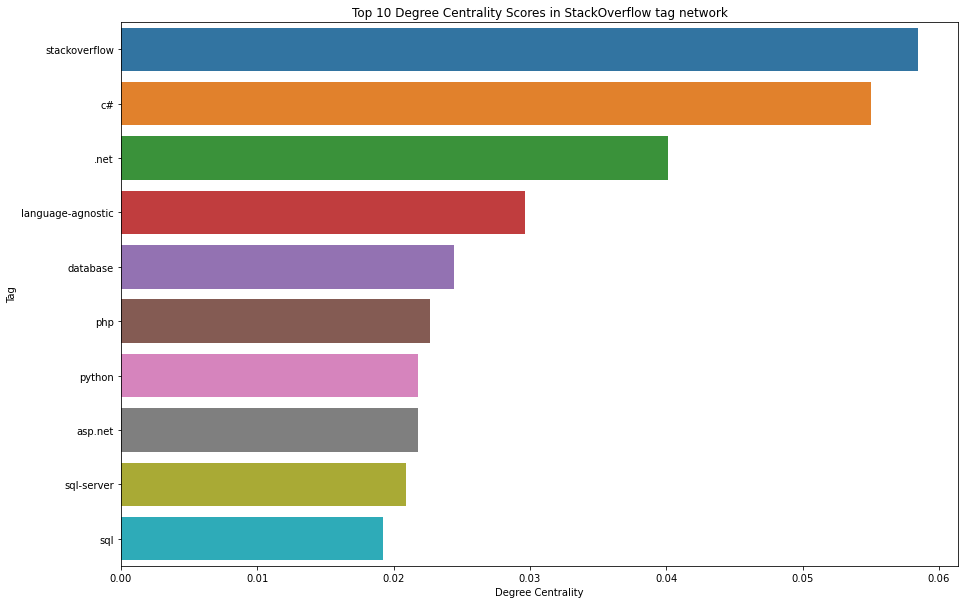

In [6]:
#Finding the degree centrality
degreeCentrality = nx.degree_centrality(G)
# print degreeCentrality
tag = []
centrality = []

for key, value in degreeCentrality.items():
    tag.append(key)
    centrality.append(value)

cent = pd.DataFrame()
cent['Tags'] = tag
cent['centrality'] = centrality

cent = cent.sort_values(by='centrality', ascending=False)
#Plotting the nodes with high degree centrality
plt.figure(figsize=(15, 10))
_ = sns.barplot(x='centrality', y='Tags', data=cent[:10], orient='h')
_ = plt.xlabel('Degree Centrality')
_ = plt.ylabel('Tag')
_ = plt.title('Top 10 Degree Centrality Scores in StackOverflow tag network')
plt.show()

<h3>1.2. Betweenness Centrality</h3>

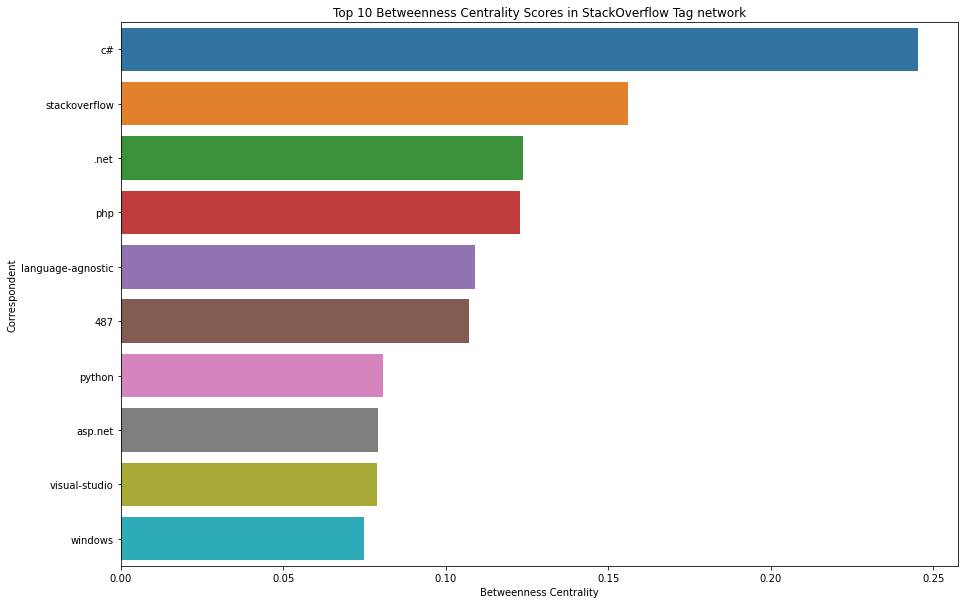

In [7]:
#Calculating betweenness centrality and plotting the ones with high value
between = nx.betweenness_centrality(G)
# print between
tag = []
betweenness = []

for key, value in between.items():
    tag.append(key)
    betweenness.append(value)

bet = pd.DataFrame()
bet['Tag'] = tag
bet['betweenness'] = betweenness

bet = bet.sort_values(by='betweenness', ascending=False)
#Plotting the nodes with high betweenness centrality

plt.figure(figsize=(15, 10))
_ = sns.barplot(x='betweenness', y='Tag', data=bet[:10], orient='h')
_ = plt.xlabel('Betweenness Centrality')
_ = plt.ylabel('Correspondent')
_ = plt.title('Top 10 Betweenness Centrality Scores in StackOverflow Tag network')
plt.show()

<h3>1.3. Density</h3>

In [8]:
#Density of the graph
print(nx.density(G))

0.002282302569416233


<h3>1.4. Eigenvector Centrality</h3>

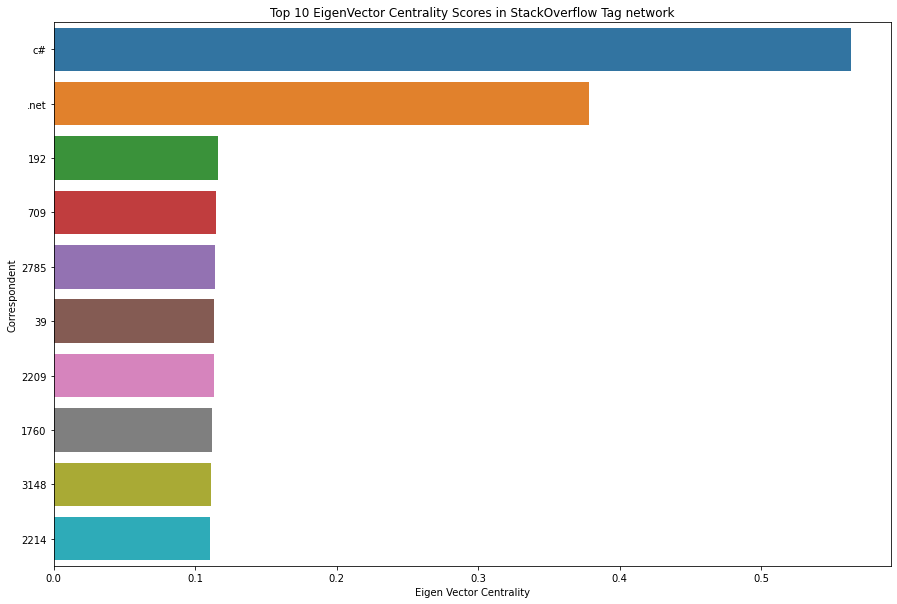

In [9]:
#Calculating eigenvector centrality and plotting the ones with high value
eigen = nx.eigenvector_centrality(G, max_iter=600)

tag = []
eigenvect = []

for key, value in eigen.items():
    tag.append(key)
    eigenvect.append(value)

ev = pd.DataFrame()
ev['Tag'] = tag
ev['EigenVector'] = eigenvect

ev = ev.sort_values(by='EigenVector', ascending=False)

plt.figure(figsize=(15, 10))
_ = sns.barplot(x='EigenVector', y='Tag', data=ev[:10], orient='h')
_ = plt.xlabel('Eigen Vector Centrality')
_ = plt.ylabel('Correspondent')
_ = plt.title('Top 10 EigenVector Centrality Scores in StackOverflow Tag network')
plt.show()

<h3>1.5. Average Degree Connectivity</h3>

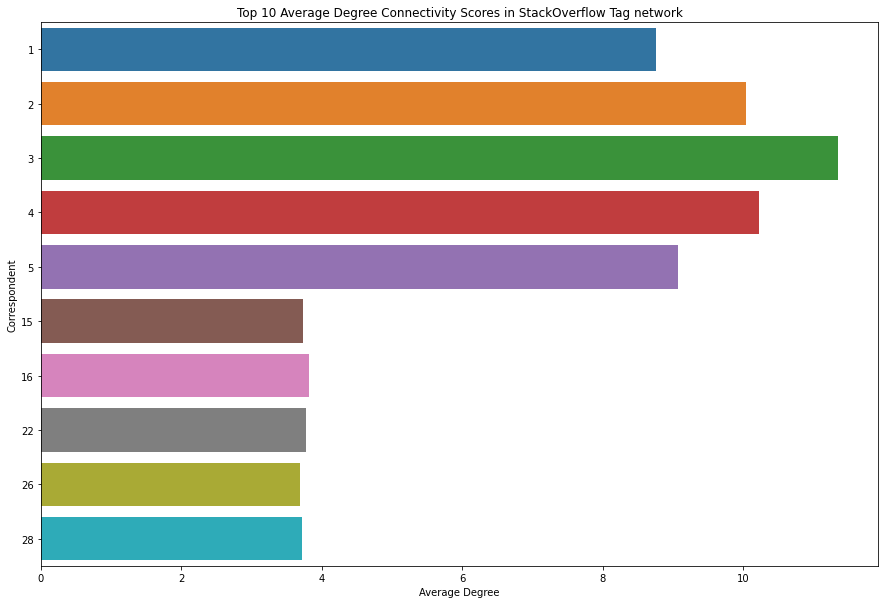

In [10]:
#Calculating average degree connectivity and plotting the ones with high value
avgdeg = nx.average_degree_connectivity(G)

tag = []
avgd = []

for key, value in avgdeg.items():
    tag.append(key)
    avgd.append(value)

ad = pd.DataFrame()
ad['Tag'] = tag
ad['AverageDegree'] = avgd

ad = ad.sort_values(by='AverageDegree', ascending=False)

plt.figure(figsize=(15, 10))
_ = sns.barplot(x='AverageDegree', y='Tag', data=ad[:10], orient='h')
_ = plt.xlabel('Average Degree')
_ = plt.ylabel('Correspondent')
_ = plt.title('Top 10 Average Degree Connectivity Scores in StackOverflow Tag network')
plt.show()

<h3>1.6. PageRank</h3>

In [11]:
#Calculating page rank for the nodes and plotting them
pg_rank = nx.pagerank(G)

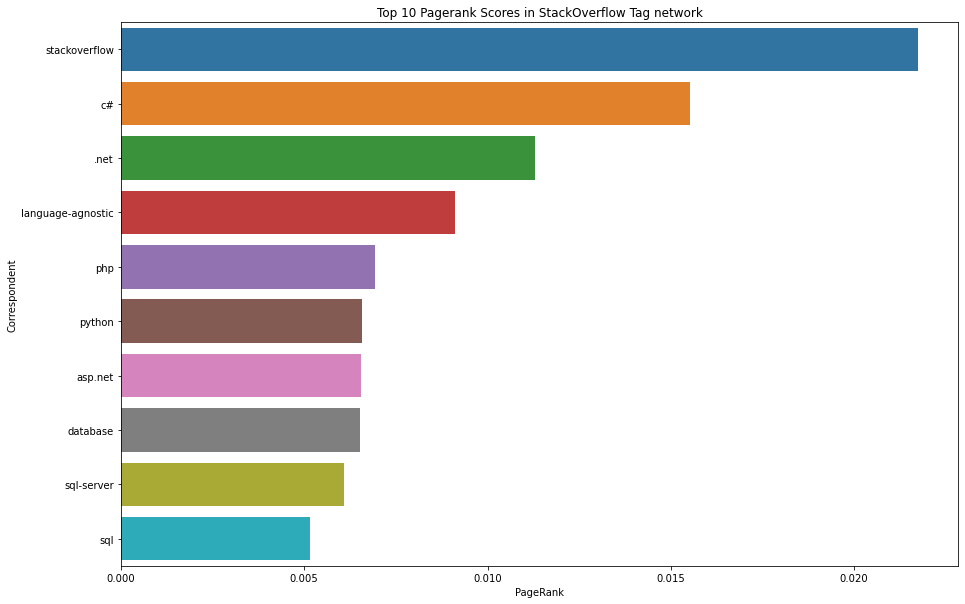

In [12]:
tag = []
pr = []

for key, value in pg_rank.items():
    tag.append(key)
    pr.append(value)

pagerank = pd.DataFrame()
pagerank['Tag'] = tag
pagerank['PageRank'] = pr

pagerank = pagerank.sort_values(by='PageRank', ascending=False)

plt.figure(figsize=(15, 10))
_ = sns.barplot(x='PageRank', y='Tag', data=pagerank[:10], orient='h')
_ = plt.xlabel('PageRank')
_ = plt.ylabel('Correspondent')
_ = plt.title('Top 10 Pagerank Scores in StackOverflow Tag network')
plt.show()

<h3>1.7. Bridges</h3>

In [13]:
#Checking whether the graph has bridges
print(nx.has_bridges(G))

True


<h3>1.8. Connected Components</h3>

In [14]:
#Printing the number of connected components since the graph is disconnected
print(nx.number_connected_components(G))

33


<h3>1.9. Neighbor Analysis</h3>

In [15]:
#Neighbor analysis of node 6
neighbors_6 = (nx.all_neighbors(G, 6))

In [16]:
list(neighbors_6)

['html', 'css', 'css3', 'internet-explorer-7']

In [17]:
#Shortest path between 6 and 286
print(nx.shortest_path(G, 6, 286))

[6, 'css', 286]


<h2>2. Analysing the largest connected sub component</h2>

In [18]:
#Extracting the largest connected sub component present
cur_graph = G

if not nx.is_connected(cur_graph):
    # get a list of unconnected networks
    sub_graphs = (G.subgraph(c) for c in nx.connected_components(G))
    sub_graphs = list(sub_graphs)
    main_graph = sub_graphs[0]

    # find the largest network in that list
    for sg in sub_graphs:
        if len(sg.nodes()) > len(main_graph.nodes()):
            main_graph = sg

    cur_graph = main_graph

<h3>2.1. Diameter Of the sub graph</h3>

In [19]:
#Diameter of sub graph
print(nx.diameter(cur_graph))

16


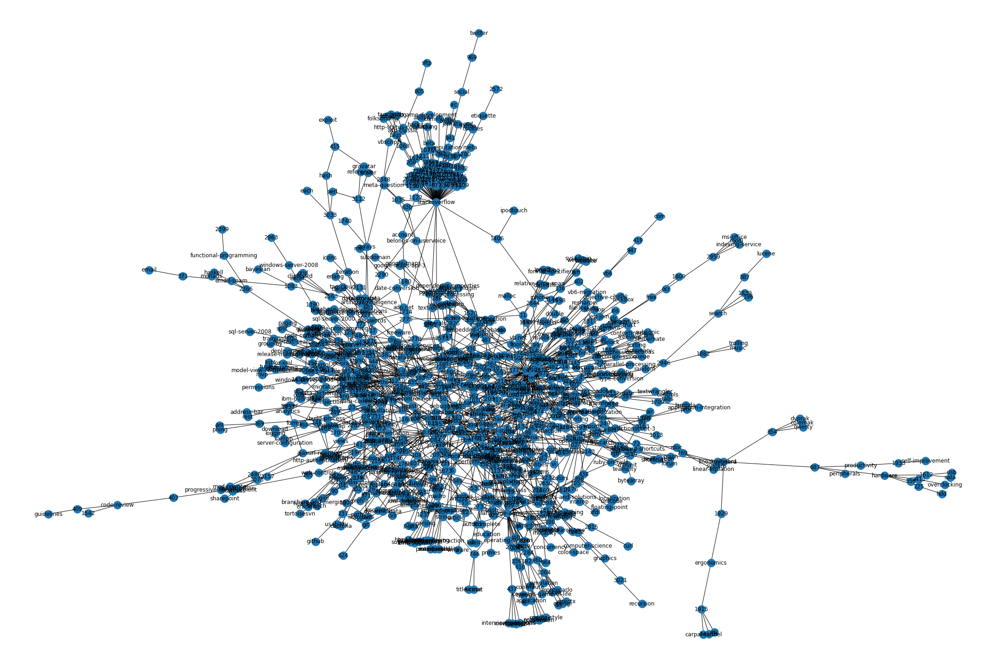

In [20]:
#Plotting the sub graph
figure(figsize=(30, 20))
Grsub = nx.draw(cur_graph, with_labels=True)
Grsub

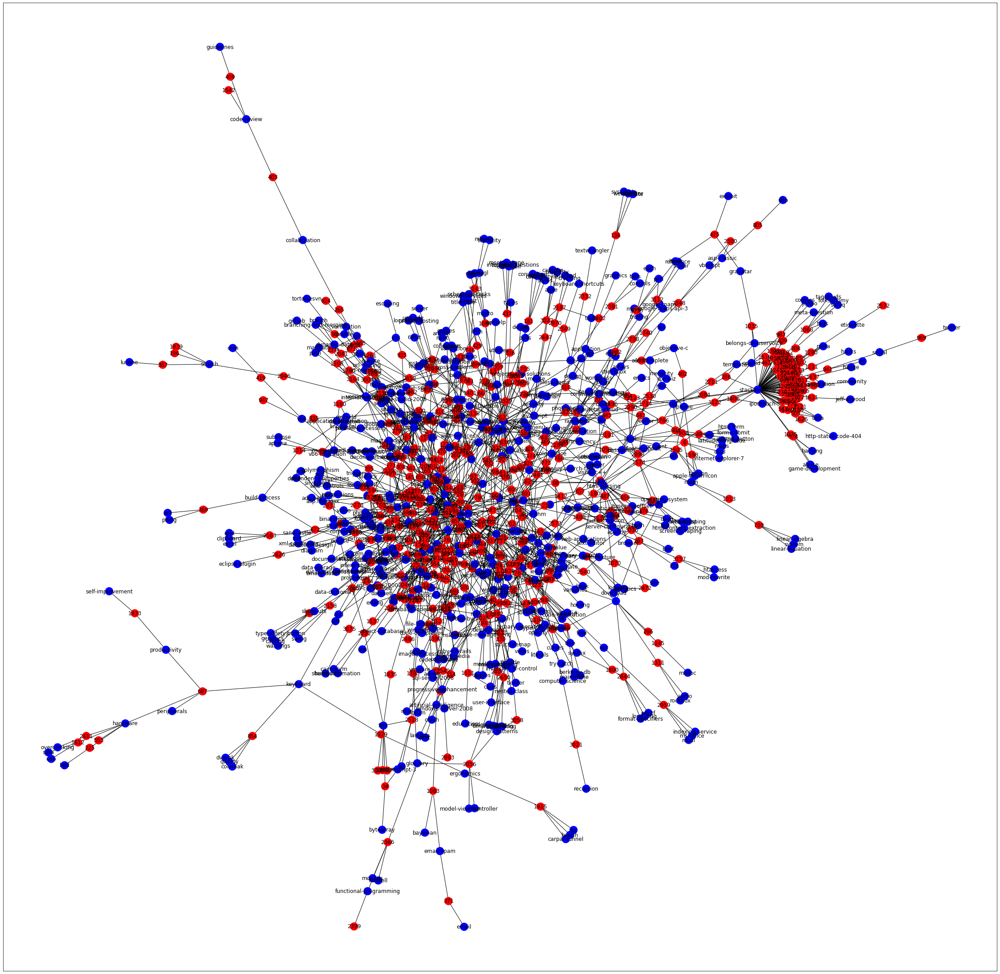

In [21]:
#Coloring the question id and tags in sub graph
colored_graph = nx.Graph()
colored_graph = cur_graph
colors=[]
for i in cur_graph.nodes:
    if(type(i)==int):
        colors.append('red')
    else:
        colors.append('blue')
plt.figure(figsize=(40,40))
nx.draw_networkx(colored_graph, with_labels=True,node_color=colors)
plt.show()

<h3>2.2. Edge Betweenness</h3>

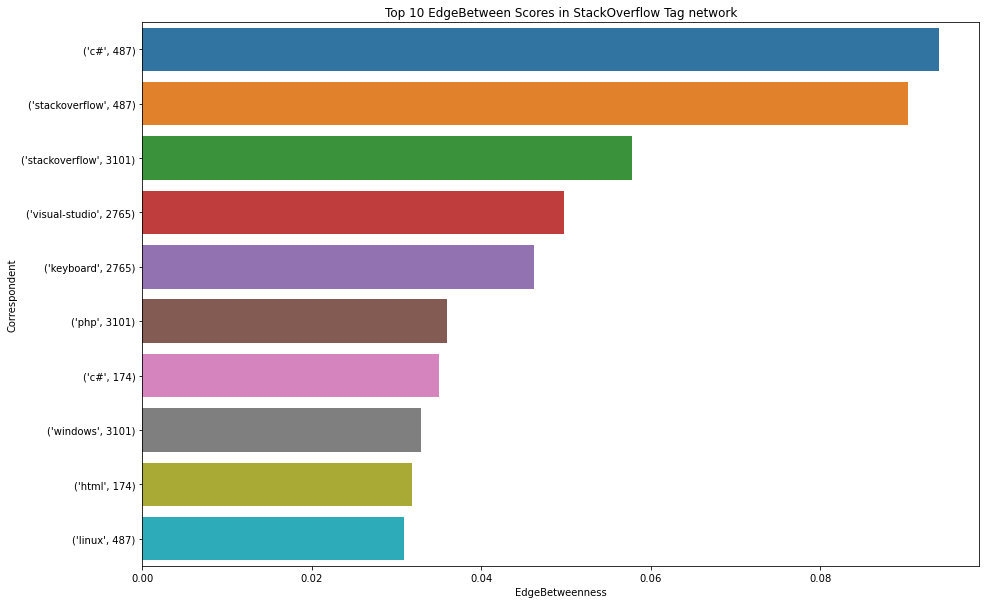

In [22]:
#Calculating edge betweenness of the edges
edge_bet = nx.edge_betweenness(cur_graph)
tag = []
eb = []

for key, value in edge_bet.items():
    tag.append(key)
    eb.append(value)

edgebetween = pd.DataFrame()
edgebetween['Tag'] = tag
edgebetween['EdgeBetweenness'] = eb

edgebetween = edgebetween.sort_values(by='EdgeBetweenness', ascending=False)
#Plotting the edges which has high edge betweenness
plt.figure(figsize=(15, 10))
_ = sns.barplot(x='EdgeBetweenness', y='Tag', data=edgebetween[:10], orient='h')
_ = plt.xlabel('EdgeBetweenness')
_ = plt.ylabel('Correspondent')
_ = plt.title('Top 10 EdgeBetween Scores in StackOverflow Tag network')
plt.show()

In [23]:
#Shortest path between 664 and 549
print(nx.shortest_path(cur_graph, 664, 549))

[664, 'open-source', 2284, 'language-agnostic', 549]


<h3>2.3. Community Detection</h3>

In [24]:
#Import for community detection
from networkx.algorithms import community

In [25]:
#Generating communities using Girvan-Newman algorithm
communities_generator = community.girvan_newman(cur_graph)

In [26]:
tl = list(list(c) for c in next(communities_generator))

In [27]:
#First level community
tll=[]
for i in tl:
    for j in i:
        tll.append(j)
    break
tll

[4,
 6,
 'format',
 8,
 9,
 2056,
 11,
 'diagram',
 'alt.net',
 13,
 14,
 16,
 17,
 19,
 23,
 24,
 25,
 'int',
 2041,
 'zos',
 'localization',
 34,
 36,
 2084,
 38,
 39,
 40,
 'software-engineering',
 42,
 'open-source',
 2092,
 48,
 2097,
 2101,
 'website',
 'mbunit',
 'carpal-tunnel',
 2106,
 59,
 'html',
 'apache',
 'sata',
 '64bit',
 66,
 '.net',
 2120,
 72,
 'artificial-intelligence',
 2123,
 'nant',
 2125,
 'winhelp',
 'unicode',
 'protocol-buffers',
 'connection',
 79,
 80,
 'sql-server-2000',
 85,
 2134,
 'build-process',
 88,
 2131,
 2138,
 90,
 'delphi',
 104,
 'dash',
 2154,
 2155,
 'adobe',
 109,
 2158,
 108,
 'metacity',
 'cairngorm',
 120,
 123,
 126,
 'resharper',
 'guidelines',
 129,
 'rdoc',
 134,
 'wpf',
 136,
 'memory-leaks',
 'formatting',
 2187,
 145,
 146,
 2196,
 2209,
 163,
 164,
 2214,
 2217,
 'article',
 'windows-server-2003',
 'tkinter',
 173,
 174,
 2222,
 176,
 177,
 'format-specifiers',
 180,
 'subsonic',
 181,
 'collections',
 2232,
 'visual-studio',
 'wi

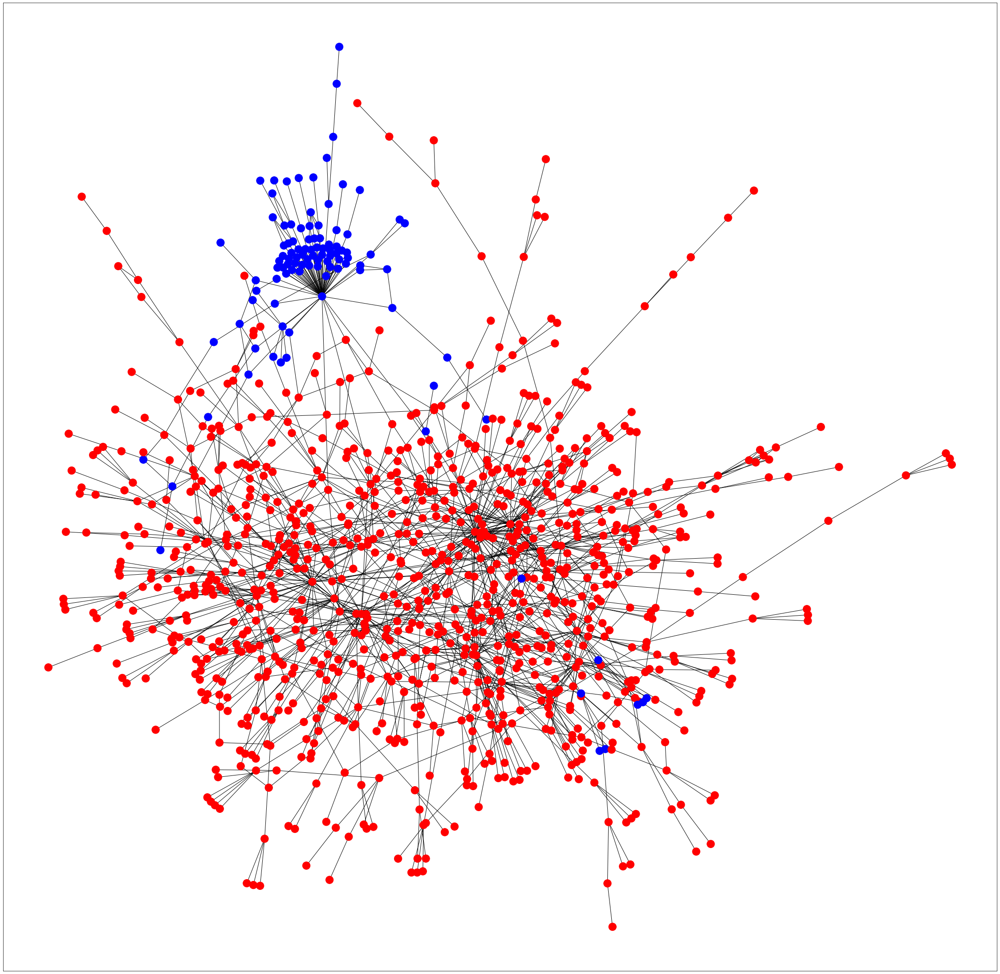

In [28]:
#Top level community present in the sub graph
clr_comm = nx.Graph()
clr_comm = cur_graph
clrs=[]
for i in clr_comm.nodes:
    if i in tll:
        clrs.append('red')
    else:
        clrs.append('blue')
plt.figure(figsize=(40,40))
nx.draw_networkx(clr_comm, with_labels=False,node_color=clrs)
plt.show()

In [29]:
print(nx.info(cur_graph))

Name: 
Type: Graph
Number of nodes: 1058
Number of edges: 1443
Average degree:   2.7278


<h3>2.4. Questions which are likely to appear together</h3>

In [30]:
#Find the shortest path between the given id and every other question 
path_list=[]
node_num = int(input("Enter the question id: "))
for i in colored_graph.nodes:
    if(type(i)==int):
        if(i!=node_num):
            path = nx.shortest_path(colored_graph, node_num, i)
            path_list.append(path)

In [31]:
def len_func(l):
    return len(l)

In [32]:
#Sort the shortest paths based on their lengths
path_list.sort(key=len_func)

In [33]:
#Print the top 6 nodes which are nearer to the given question id
print("The questions with id which are most likely to appear along with", node_num)
node_list=[]
count=0
for i in path_list:
    if count>5:
        break
    length = len(i)
    print(i[length-1])
    node_list.append(i[length-1])
    count+=1

The questions with id which are most likely to appear along with 4
8
9
11
16
38
39


<h2>3. Tag Prediction</h2>

In [34]:
#Read the csv files as dataframes
df = pd.read_csv("Questions.csv", encoding="ISO-8859-1")
tags = pd.read_csv("Tags.csv", encoding="ISO-8859-1", dtype={'Tag': str})

In [35]:
tags['Tag'] = tags['Tag'].astype(str)

In [36]:
#Grouping the tags together
grouped_tags = tags.groupby("Id")['Tag'].apply(lambda tags: ' '.join(tags))

In [37]:
grouped_tags.reset_index()

,Id,Tag
0,80,flex actionscript-3 air
1,90,svn tortoisesvn branch branching-and-merging
2,120,sql asp.net sitemap
3,180,algorithm language-agnostic colors color-space
4,260,c# .net scripting compiler-construction
...,...,...
1264211,40143210,php .htaccess
1264212,40143300,google-bigquery
1264213,40143340,android android-studio
1264214,40143360,javascript vue.js


In [38]:
#Converting it to a dataframe
grouped_tags_final = pd.DataFrame({'Id':grouped_tags.index, 'Tags':grouped_tags.values})

In [39]:
#Dropping unnecessary columns
df.drop(columns=['OwnerUserId', 'CreationDate', 'ClosedDate'], inplace=True)

In [40]:
df = df.merge(grouped_tags_final, on='Id')

In [41]:
#Extract the questions which has score more than 5
new_df = df[df['Score']>5]

In [42]:
new_df.head(5)

,Id,Score,Title,Body,Tags
0,80,26,SQLStatement.execute() - multiple queries in o...,<p>I've written a database generation script i...,flex actionscript-3 air
1,90,144,Good branching and merging tutorials for Torto...,<p>Are there any really good tutorials explain...,svn tortoisesvn branch branching-and-merging
2,120,21,ASP.NET Site Maps,<p>Has anyone got experience creating <strong>...,sql asp.net sitemap
3,180,53,Function for creating color wheels,<p>This is something I've pseudo-solved many t...,algorithm language-agnostic colors color-space
4,260,49,Adding scripting functionality to .NET applica...,<p>I have a little game written in C#. It uses...,c# .net scripting compiler-construction


In [43]:
#Import nltk packages for data pre-processing
import nltk
from nltk.tokenize import ToktokTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import stopwords

In [44]:
new_df.dropna(subset=['Tags'], inplace=True)

<ipython-input-44-b044d0fc37c9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df.dropna(subset=['Tags'], inplace=True)


In [45]:
new_df.head(5)

,Id,Score,Title,Body,Tags
0,80,26,SQLStatement.execute() - multiple queries in o...,<p>I've written a database generation script i...,flex actionscript-3 air
1,90,144,Good branching and merging tutorials for Torto...,<p>Are there any really good tutorials explain...,svn tortoisesvn branch branching-and-merging
2,120,21,ASP.NET Site Maps,<p>Has anyone got experience creating <strong>...,sql asp.net sitemap
3,180,53,Function for creating color wheels,<p>This is something I've pseudo-solved many t...,algorithm language-agnostic colors color-space
4,260,49,Adding scripting functionality to .NET applica...,<p>I have a little game written in C#. It uses...,c# .net scripting compiler-construction


In [46]:
#Initialize the pre-processors
lemma=WordNetLemmatizer()
stop_words = set(stopwords.words("english"))
token=ToktokTokenizer()

In [47]:
def lemitizeWords(text):
    words=token.tokenize(text)
    listLemma=[]
    for w in words:
        x=lemma.lemmatize(w, pos="v")
        listLemma.append(x)
    return ' '.join(map(str, listLemma))

In [48]:
def stopWordsRemove(text):
    stop_words = set(stopwords.words("english"))
    words=token.tokenize(text)
    filtered = [w for w in words if not w in stop_words]
    return ' '.join(map(str, filtered))

In [49]:
#Cleaning the title of questions
new_df['Title'] = new_df['Title'].apply(lambda x: str(x))
new_df['Title'] = new_df['Title'].apply(lambda x: lemitizeWords(x)) 
new_df['Title'] = new_df['Title'].apply(lambda x: stopWordsRemove(x)) 

<ipython-input-49-6fd16f7b1458>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['Title'] = new_df['Title'].apply(lambda x: str(x))
<ipython-input-49-6fd16f7b1458>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['Title'] = new_df['Title'].apply(lambda x: lemitizeWords(x))
<ipython-input-49-6fd16f7b1458>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

In [50]:
new_df.head(5)

,Id,Score,Title,Body,Tags
0,80,26,SQLStatement.execute( ) - multiple query one s...,<p>I've written a database generation script i...,flex actionscript-3 air
1,90,144,Good branch merge tutorials TortoiseSVN ?,<p>Are there any really good tutorials explain...,svn tortoisesvn branch branching-and-merging
2,120,21,ASP.NET Site Maps,<p>Has anyone got experience creating <strong>...,sql asp.net sitemap
3,180,53,Function create color wheel,<p>This is something I've pseudo-solved many t...,algorithm language-agnostic colors color-space
4,260,49,Adding script functionality .NET applications,<p>I have a little game written in C#. It uses...,c# .net scripting compiler-construction


In [51]:
#Import scikit learn packages for prediction
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import hamming_loss
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [52]:
#Count vectorize the tags
vectorizer = CountVectorizer(tokenizer = lambda x: x.split(), binary=True)
multilabel_y = vectorizer.fit_transform(new_df['Tags'])

In [53]:
multilabel_y.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [54]:
new_df.shape

(72950, 5)

In [55]:
#Train test split (80-20)
x_train=new_df.head(58360)
x_test=new_df.tail(new_df.shape[0] - 58360)

y_train = multilabel_y[0:58360,:]
y_test = multilabel_y[58360:new_df.shape[0],:]

In [56]:
y_test.shape

(14590, 14883)

In [57]:
x_train

,Id,Score,Title,Body,Tags
0,80,26,SQLStatement.execute( ) - multiple query one s...,<p>I've written a database generation script i...,flex actionscript-3 air
1,90,144,Good branch merge tutorials TortoiseSVN ?,<p>Are there any really good tutorials explain...,svn tortoisesvn branch branching-and-merging
2,120,21,ASP.NET Site Maps,<p>Has anyone got experience creating <strong>...,sql asp.net sitemap
3,180,53,Function create color wheel,<p>This is something I've pseudo-solved many t...,algorithm language-agnostic colors color-space
4,260,49,Adding script functionality .NET applications,<p>I have a little game written in C#. It uses...,c# .net scripting compiler-construction
...,...,...,...,...,...
571887,19759800,8,Android project show duplicate app upon deploy...,<p>My directory structure is as follows:</p>\n...,android android-studio
571922,19761080,6,Formatting date input use simple_form,<p>I have a <code>date</code> type field in my...,html ruby-on-rails date input simple-form
571959,19762350,14,Execute exe file use node.js,<p>I don't know how to execute an <code>exe</c...,javascript node.js
571964,19762430,7,Make field require Mongoose,<p>Mongoose seems to default to make all field...,node.js mongodb mongoose schema


In [58]:
#Tfidf vectorizer for text data (title)
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_tf = TfidfVectorizer(min_df=0.00009, max_features=200000, smooth_idf=True, norm="l2", \
                             tokenizer = lambda x: x.split(), sublinear_tf=False, ngram_range=(1,2))

In [59]:
x_train_final = x_train['Title']
x_test_final = x_test['Title']

In [60]:
x_train_final.shape

(58360,)

In [61]:
x_train_multilabel = vectorizer_tf.fit_transform(x_train_final)
x_test_multilabel = vectorizer_tf.transform(x_test_final)

In [62]:
x_train_multilabel.shape

(58360, 10631)

In [63]:
y_train.shape

(58360, 14883)

In [64]:
#One vs Rest classifier for multi-class classification
classifier = OneVsRestClassifier(SGDClassifier(loss='hinge', alpha=0.00001, penalty='l1'), n_jobs=-1)
classifier.fit(x_train_multilabel, y_train)
predictions = classifier.predict (x_test_multilabel)

In [65]:
#Metrics score
print("Hamming loss ",hamming_loss(y_test,predictions))
#Since it is tag prediction, the precision and recall score plays a major role
precision = precision_score(y_test, predictions, average='micro')
recall = recall_score(y_test, predictions, average='micro')
f1 = f1_score(y_test, predictions, average='micro')
print("Precision: {:.4f}, Recall: {:.4f}, F1-measure: {:.4f}".format(precision, recall, f1))

Hamming loss  0.0001798999064993907
Precision: 0.7528, Recall: 0.2574, F1-measure: 0.3836
